In [69]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

# Make Deep Dream Model

In [2]:
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 23s 0us/step


In [3]:
base_model.summary()

Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, None,      │        864 │ input_layer[0][0] │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, None,      │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, None,      │      9,216 │ activation[0][0]  │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, None,      │     18,432 │ activation_1[0][… │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, None,      │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, None,      │      5,120 │ max_pooling2d[0]… │
│                     │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, None,      │    138,240 │ activation_3[0][… │
│                     │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, None,      │          0 │ batch_normalizat

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 21,768,352 (83.04 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [131]:
# names = ['mixed3', 'mixed5', 'mixed8', 'mixed9']      # concatenation layers in InceptionV3. The more layers used, the more time it takes to train 
# names = ['mixed3', 'mixed5', 'mixed7', 'mixed10']      # concatenation layers in InceptionV3. The more layers used, the more time it takes to train 
# names = ['mixed3', 'mixed5', 'mixed10']      # concatenation layers in InceptionV3. The more layers used, the more time it takes to train 
names = ['mixed3', 'mixed5']

In [132]:
base_model.input

<KerasTensor shape=(None, None, None, 3), dtype=float32, sparse=None, name=keras_tensor>

In [133]:
layers = [base_model.get_layer(name).output for name in names]

In [134]:
layers

[<KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, name=keras_tensor_100>,
 <KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, name=keras_tensor_164>]

In [135]:
deep_dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

## Preprocess Images

In [99]:
image = tf.keras.preprocessing.image.load_img('StaryNight.jpg', target_size=(225, 375)) # target size is the input image size that InceptionV3 takes

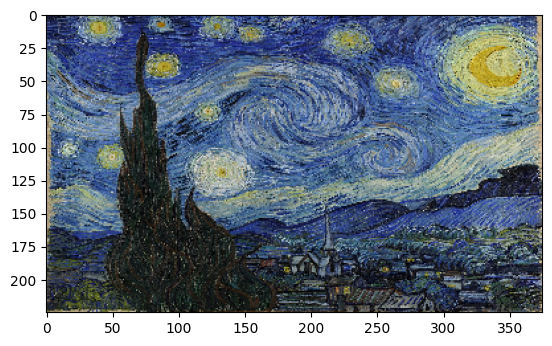

In [100]:
plt.imshow(image)

In [101]:
type(image)

PIL.Image.Image

In [102]:
image.size

(375, 225)

In [103]:
image.mode, len(image.mode)

('RGB', 3)

In [104]:
image.getdata()

In [105]:
list(image.getdata())   # value of each pixel  

[(6, 10, 11),
 (30, 33, 66),
 (35, 46, 66),
 (39, 46, 65),
 (46, 49, 68),
 (23, 27, 39),
 (13, 15, 38),
 (57, 61, 86),
 (85, 88, 97),
 (147, 147, 139),
 (138, 139, 123),
 (112, 116, 117),
 (18, 21, 52),
 (23, 28, 60),
 (85, 96, 116),
 (83, 92, 121),
 (148, 152, 155),
 (29, 32, 63),
 (57, 63, 99),
 (12, 20, 39),
 (34, 39, 69),
 (23, 30, 56),
 (4, 12, 48),
 (25, 32, 74),
 (48, 50, 98),
 (134, 133, 173),
 (127, 132, 152),
 (126, 133, 161),
 (138, 151, 168),
 (64, 76, 126),
 (67, 83, 119),
 (61, 75, 112),
 (73, 90, 134),
 (86, 118, 143),
 (55, 81, 80),
 (136, 155, 135),
 (51, 65, 74),
 (152, 169, 195),
 (156, 176, 211),
 (56, 79, 129),
 (94, 116, 165),
 (70, 94, 120),
 (160, 173, 189),
 (142, 156, 185),
 (92, 118, 135),
 (50, 74, 118),
 (107, 132, 162),
 (101, 122, 153),
 (27, 36, 67),
 (34, 44, 79),
 (97, 114, 140),
 (21, 41, 66),
 (51, 60, 101),
 (50, 56, 104),
 (34, 39, 68),
 (22, 24, 45),
 (3, 3, 29),
 (4, 7, 22),
 (28, 37, 34),
 (19, 27, 29),
 (19, 25, 41),
 (43, 49, 75),
 (93, 104, 1

Since image is not of ndarry type, it is not compatible with tensorflow. So we will convert image of type 'image' into array type.

In [106]:
image = tf.keras.preprocessing.image.img_to_array(image)

In [107]:
type(image)

numpy.ndarray

In [108]:
image.shape

(225, 375, 3)

In [109]:
image.min(), image.max()    # within range 0 to 255. We need to normalize it to -1 to 1

(0.0, 255.0)

We use built in function of tensorflow for InceptionV3 as it will apply all the preprocessing that was did in the original training of the Model, written in the Research paper.

In [44]:
# image = image / 255.0
image = tf.keras.applications.inception_v3.preprocess_input(image)   # normalizes the image to 0 to 1. It also converts the image to a tensor. 

In [46]:
image.min(), image.max()    # Notice how it is not between 0 and 1, it is because the original preprocessing done on the inceptionV3 inorder to train it was had preprocessed it between -1 and 1.


(-1.0, 1.0)

## Checking with cv2, Skip

In [23]:
import cv2

image = cv2.imread('StaryNight.jpg')
image = cv2.resize(image, (375, 225))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

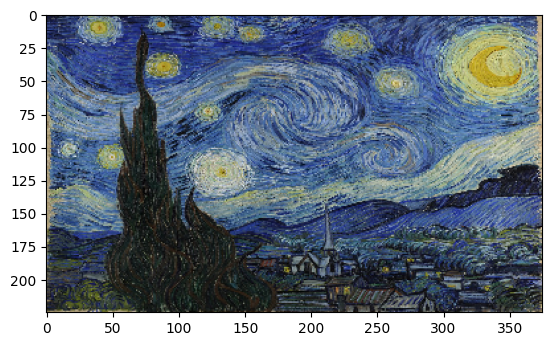

In [24]:
plt.imshow(image)

In [25]:
type(image)

numpy.ndarray

In [ ]:
image.shape

## Continue

# Getting Activations

In [48]:
image.shape     # In order to make a prediction of the image using the model, we will need to first convert it into a batch format.

(225, 375, 3)

In [49]:
image_batch = tf.expand_dims(image, axis=0)   # This will add a dimension at the start to the image tensor. This is the batch dimension.

In [52]:
image_batch.shape   # This batch has 1 image

TensorShape([1, 225, 375, 3])

In [53]:
activation = deep_dream_model.predict(image_batch)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


In [55]:
deep_dream_model.outputs    # 2 output layers

[<KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, name=keras_tensor_100>,
 <KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, name=keras_tensor_164>]

In [56]:
len(activation)

2

In [58]:
activation[0]   # Value at the Mixed (Concatenation) Layer after applying Relu for the specified output layer

array([[[[0.5906061 , 0.5348803 , 0.        , ..., 1.6520482 ,
          0.        , 0.6775776 ],
         [1.0953629 , 0.        , 1.2273142 , ..., 0.7965112 ,
          0.        , 0.6775776 ],
         [2.0415828 , 0.        , 0.30758548, ..., 1.5217918 ,
          0.09387267, 0.11234212],
         ...,
         [1.4007593 , 0.        , 0.        , ..., 1.4881539 ,
          1.6016668 , 0.14049649],
         [1.4495715 , 0.        , 0.3868082 , ..., 1.5633016 ,
          1.6016668 , 0.        ],
         [1.9167817 , 0.        , 0.43736824, ..., 1.5633016 ,
          1.0496813 , 0.36565268]],

        [[0.        , 0.        , 0.        , ..., 0.64012694,
          0.        , 0.38969895],
         [0.        , 0.72701347, 0.        , ..., 0.7965112 ,
          0.        , 0.2540903 ],
         [0.        , 0.        , 0.        , ..., 0.7965112 ,
          0.        , 0.11234212],
         ...,
         [1.8988523 , 0.        , 0.        , ..., 0.18635213,
          0.05853391, 0.7

In [61]:
# 1 : Batch size, images in the batch
# 12, 21 : Dimensions of the image
# 768 : Activation Values

In [60]:
activation[0].shape     # It has 768 values which are the same as the value specified in the above output of the output layer

(1, 12, 21, 768)

# Calculating Loss

We use loss when comparing predicted with actual value. But here we will use loss to change value of the pixels for Deep Dream

We have 768 activation values but need 1 value to represent the value of the loss function

In [62]:
# Traditional NN: Compare output of model with expected
# DeepDream NN: Compare activation values with the image itself to update loss value

To get a single value for loss function, we will take average of each output layer's activation values and then add them.

In [80]:
def calculate_loss(image, network):
    image_batch = tf.expand_dims(image, axis=0)
    activation = network(image_batch)   # same as network.predict(image_batch) as .predict cant be called inside tf.function as .predict has its own tf.functions.

    losses = []

    for act in activation:
        loss = tf.reduce_mean(act)
        losses.append(loss)
    
    # print(losses)
    
    return  tf.reduce_sum(losses)



In [73]:
loss = calculate_loss(image, deep_dream_model)
loss

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


<tf.Tensor: shape=(), dtype=float32, numpy=0.61807656>

# Gradient Ascent

Goal is to maximize the loss value. We go up. When we maximize the value, we emphasize certain parts of the image

So we calculate the gradient w.r.s to the input image. And then change pixels of the image.

with tf.GradientTape() as tape:

    This line creates a context (tape) for recording operations to compute gradients later. tf.GradientTape is used in TensorFlow to trace computations, and it records the operations to calculate gradients during the backward pass.

tape.watch(image)

    This line explicitly instructs the tape to "watch" the image tensor. Watching a tensor means that any operations involving this tensor will be recorded, enabling the calculation of gradients with respect to this tensor during backpropagation.

In [82]:

# Function is made global so that with each change in pixel in each epoch, previous changes are not lost
@tf.function
def deep_dream(network, image, learning_rate):

    with tf.GradientTape() as tape:         #  starts a new context for gradient computation. This context is active within the indented block.
        tape.watch(image)                   # This line tells the tape to watch the image tensor. This is required to calculate the gradient of the loss with respect to the image.  By default, trainable variables (typically weights of the network) are watched, but here we need to explicitly watch the image since it's not a trainable variable in the usual sense.
        loss = calculate_loss(image, network)

    gradients = tape.gradient(loss, image)      # Getting partial derivative of the loss with respect to the image for gradient 
    gradients /= tf.math.reduce_std(gradients)      # Normalizing the gradients by dividing with the standard deviation of the gradients
    image = image + gradients * learning_rate      # Updating the image by adding the gradients multiplied by the learning rate. Similar to how we used to update weights in Traditional NN but here we are Updating pixels of the image
    image = tf.clip_by_value(image, -1, 1)      # Clipping the values of the image between -1 and 1 as the InceptionV3 model was trained on images between -1 and 1

    return loss, image



In [83]:

# Inorder to display the image, we will need to bring it back to its original form. Non-Preprocessed form.
def inverse_transform(image):
    image = 255 * (image + 1.0) / 2.0       # Prebuilt equation to convert the image back to its original form. To reverse the preprocessing done on the image
    # image = np.uint8(image)
    image = tf.cast(image, tf.uint8)
    return image


In [139]:

def run_deep_dream(network, image, epochs, learning_rate):

    for epoch in range(epochs):
        loss, image = deep_dream(network, image, learning_rate)
        
        # if epoch % 500 == 0:
        #     plt.figure(figsize=(12, 12))
        #     plt.imshow(inverse_transform(image))     # Display image in its original form, Non Preprocessed form
        #     plt.show()
        #     print(f"Epoch: {epoch}, Loss: {loss}")


    return image


# Generating Images

In [79]:
image.shape, type(image)

((225, 375, 3), numpy.ndarray)

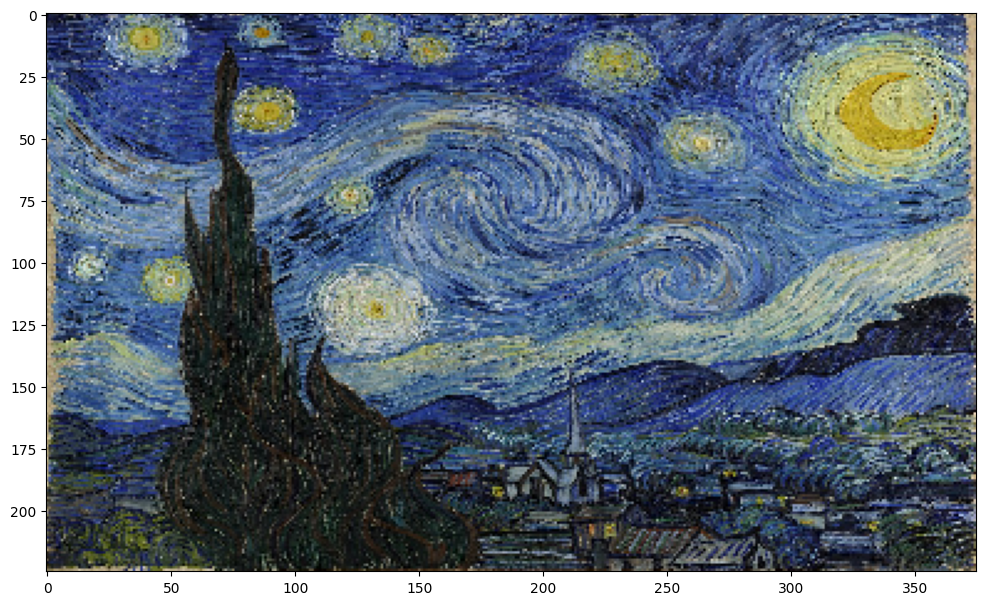

Epoch: 0, Loss: 0.6180765628814697


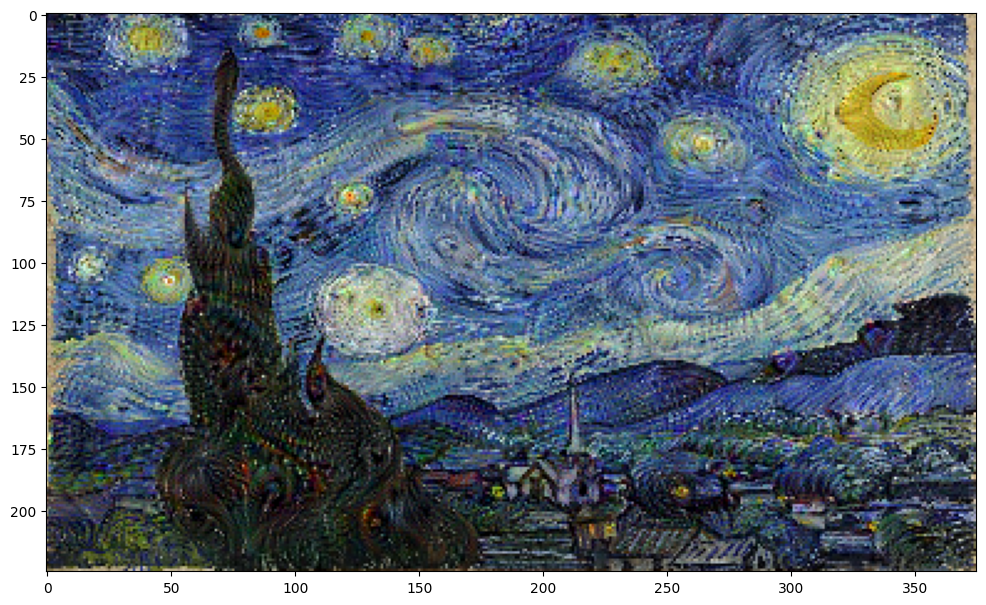

Epoch: 200, Loss: 1.7278015613555908


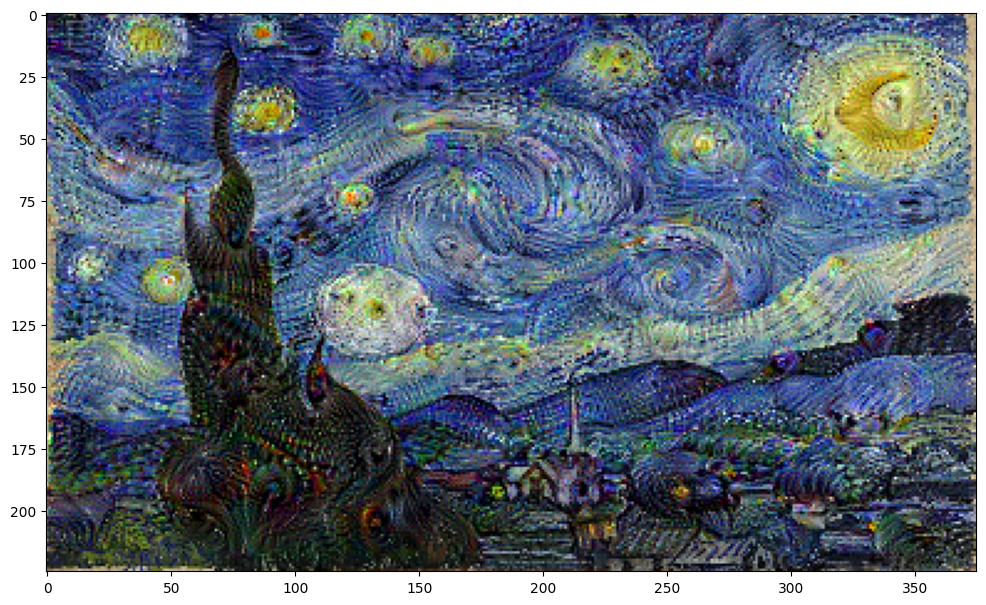

Epoch: 400, Loss: 2.0564124584198


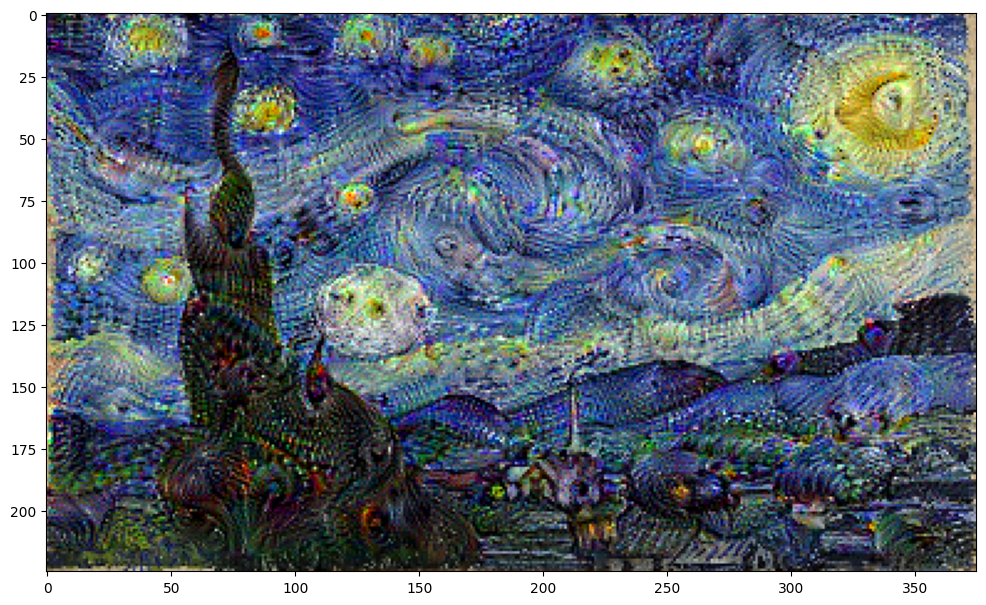

Epoch: 600, Loss: 2.2624192237854004


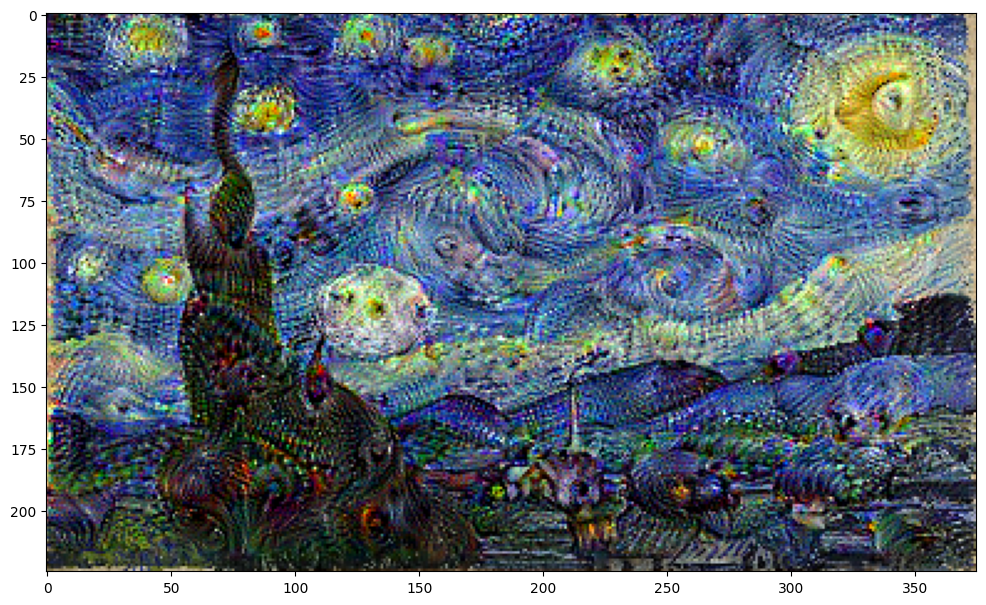

Epoch: 800, Loss: 2.4145925045013428


<tf.Tensor: shape=(225, 375, 3), dtype=float32, numpy=
array([[[-0.8403072 , -0.9834755 , -0.976745  ],
        [-0.76811826, -0.7247948 , -0.45537138],
        [-0.723218  , -0.64449567, -0.48090017],
        ...,
        [ 0.36541894,  0.20961681,  0.01279406],
        [ 0.24705887,  0.13725495, -0.1372549 ],
        [ 0.49803925,  0.38823533,  0.082353  ]],

       [[-0.82732767, -0.9496566 , -0.77087337],
        [-0.72986406, -0.76459754, -0.4306675 ],
        [-0.7785525 , -0.81646425, -0.6450254 ],
        ...,
        [ 0.3123092 ,  0.16487397, -0.11061397],
        [ 0.49803925,  0.3803922 ,  0.07450986],
        [ 0.37254906,  0.24705887, -0.01176471]],

       [[-0.6389236 , -0.8971125 , -0.49626222],
        [-0.66982913, -0.8435341 , -0.42513594],
        [-0.8783328 , -0.7988757 , -0.60699964],
        ...,
        [ 0.58904153,  0.41867262,  0.1609285 ],
        [ 0.60784316,  0.45098042,  0.16078436],
        [ 0.5529412 ,  0.41176474,  0.12941182]],

       ...,

     

In [88]:
run_deep_dream(deep_dream_model, image, epochs=1000, learning_rate=0.001)   # large learning rate, More changes and vice versa

Important: The Model tries to add features of things it has been trained on from the ImageNet dataset into the Image. To get better results, play with Learning rate, Number of layers in 'names' list (adding or subtracting new layers) and epochs

# HomeWork

In [151]:
import cv2

image = cv2.imread('StaryNight.jpg')
image = cv2.resize(image, (375, 225))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
image = tf.keras.applications.inception_v3.preprocess_input(image)      # Make sure to preprocess the image before passing it to the model, else error
image.shape, type(image)

((225, 375, 3), numpy.ndarray)

In [179]:
# names = ['mixed3', 'mixed5', 'mixed8', 'mixed9']      # concatenation layers in InceptionV3. The more layers used, the more time it takes to train 
# names = ['mixed3', 'mixed5', 'mixed7', 'mixed10']      # concatenation layers in InceptionV3. The more layers used, the more time it takes to train 
# names = ['mixed3', 'mixed5', 'mixed9']      # concatenation layers in InceptionV3. The more layers used, the more time it takes to train 
# names = ['mixed3', 'mixed5']
names = ['mixed2', 'mixed4']

layers = [base_model.get_layer(name).output for name in names]

deep_dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

In [180]:
deep_dream_model.input

<KerasTensor shape=(None, None, None, 3), dtype=float32, sparse=None, name=keras_tensor>

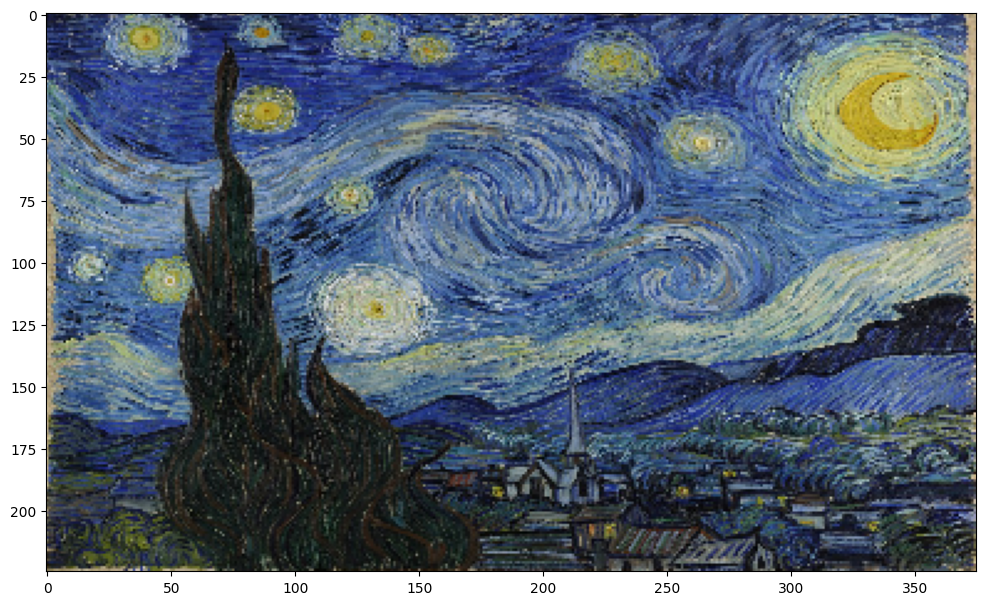

Epoch: 0, Loss: 0.5256635546684265


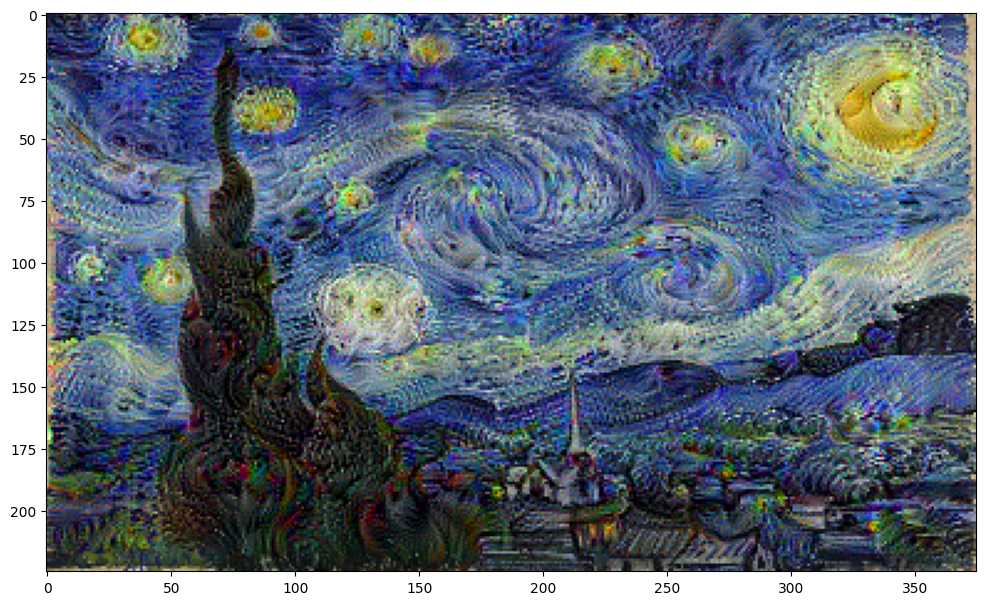

Epoch: 500, Loss: 1.5681828260421753


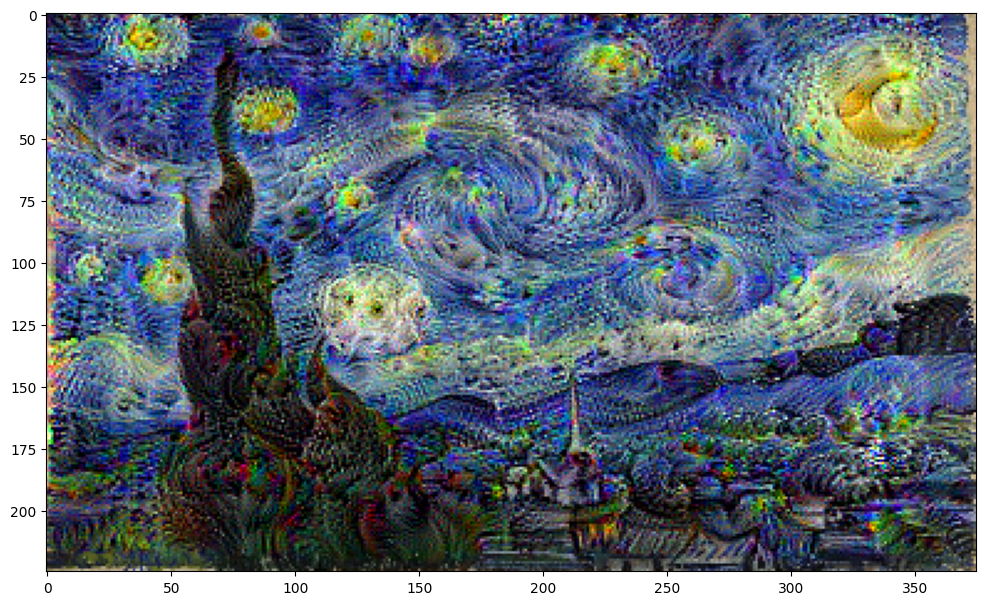

Epoch: 1000, Loss: 1.8670399188995361


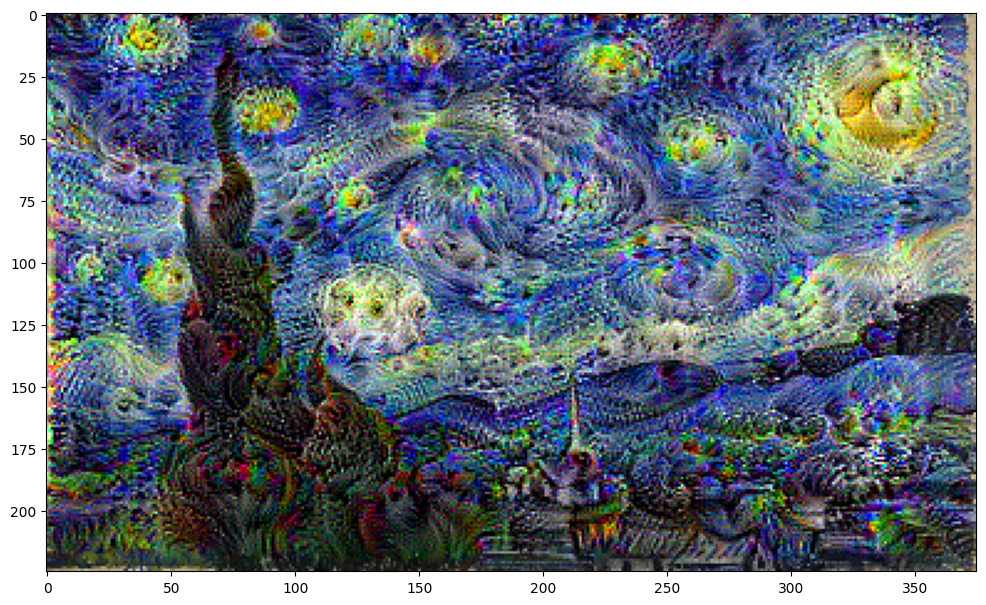

Epoch: 1500, Loss: 2.099158525466919


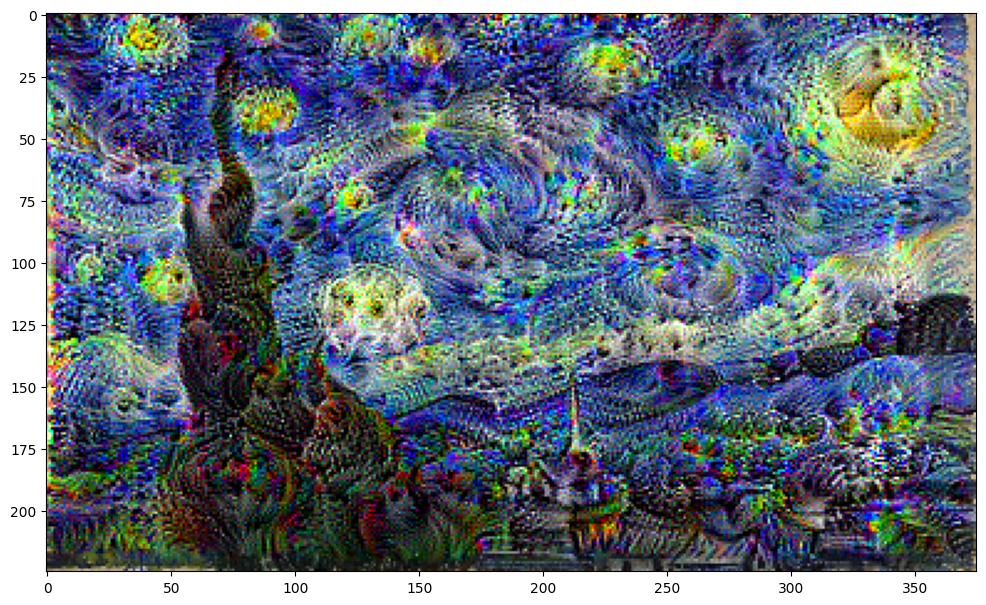

Epoch: 2000, Loss: 2.2939813137054443


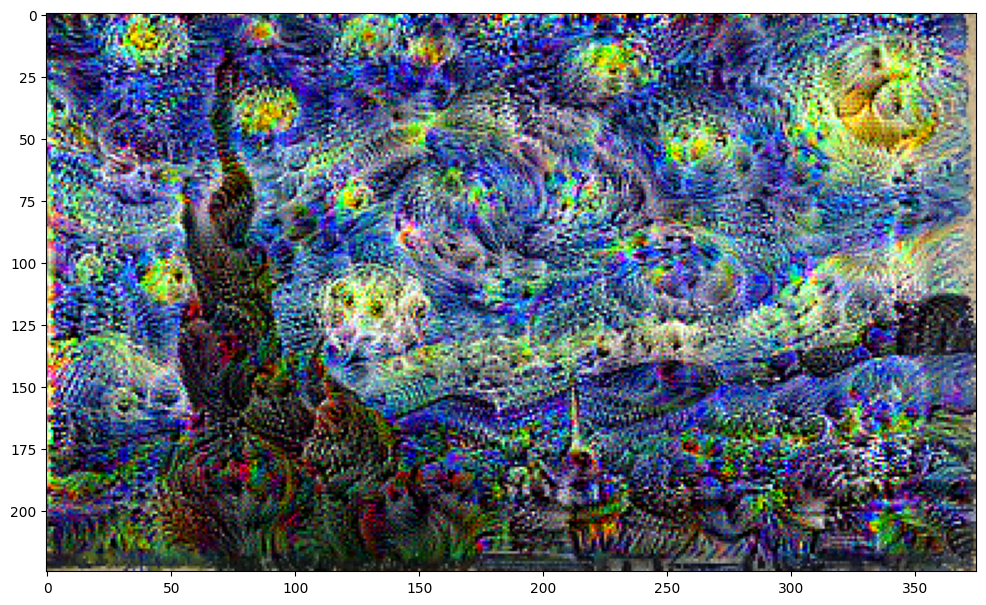

Epoch: 2500, Loss: 2.4718713760375977


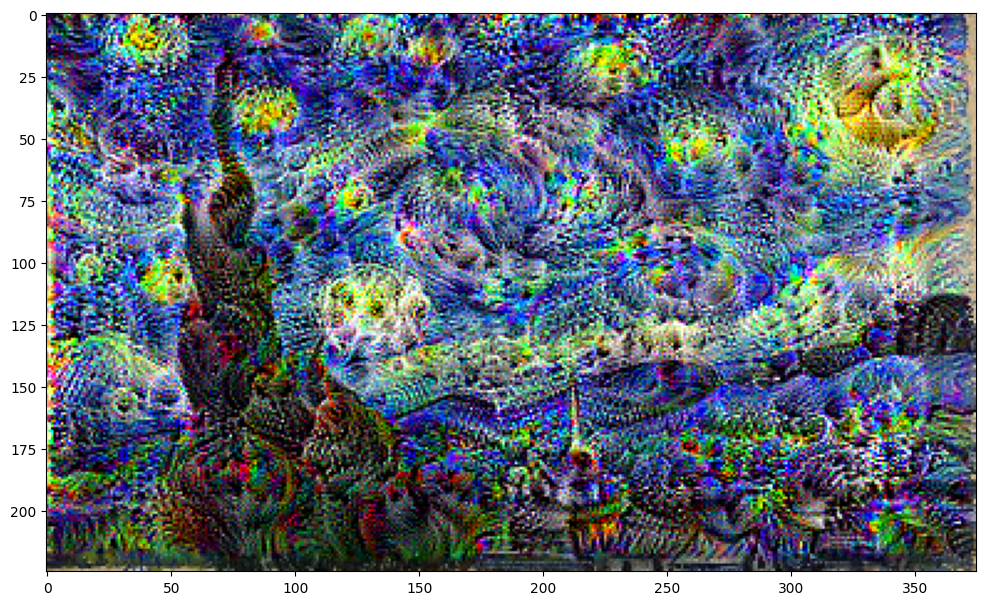

In [181]:
imager = run_deep_dream(deep_dream_model, image, epochs=3000, learning_rate=0.001)   # large learning rate, More changes and vice versa
plt.figure(figsize=(12, 12))
plt.imshow(inverse_transform(imager))     # Display image in its original form, Non Preprocessed form
plt.show()

Important Note: Apparently, Lower levels of mixed layers (concatenate) produce effects on a bigger scale while higher level of Mixed layers produce small changes.